In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas

In [69]:
scvelo.set_figure_params(style="scanpy", dpi_save=200, frameon=True, color_map="viridis")

In [2]:
# Read input file
adata = scanpy.read_h5ad("/scratch/lema/m26_losu/splice_counts_star_no_fdl.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 12875 × 78334
    obs: 'barcode', 'batch', 'sample', 'group', 'day'
    var: 'ensemble_ids', 'gene_symbol'
    uns: 'sample_colors'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


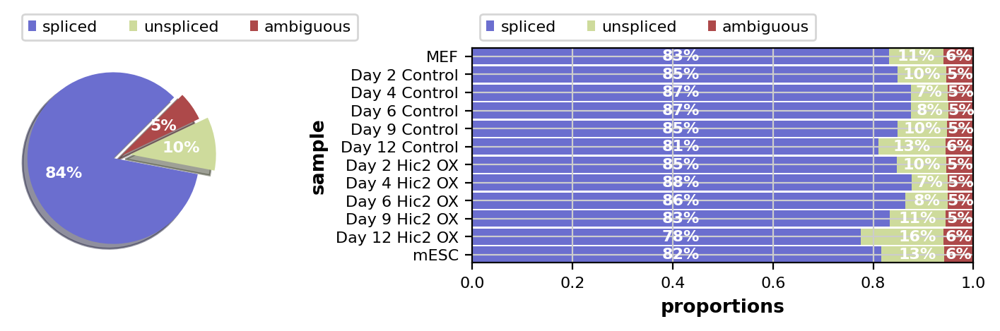

In [59]:
scvelo.pl.proportions(adata, groupby="sample")

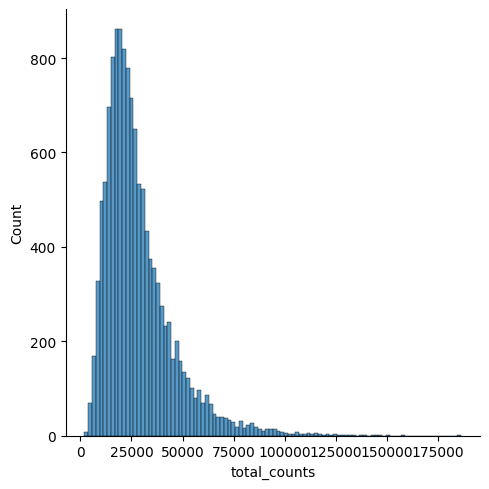

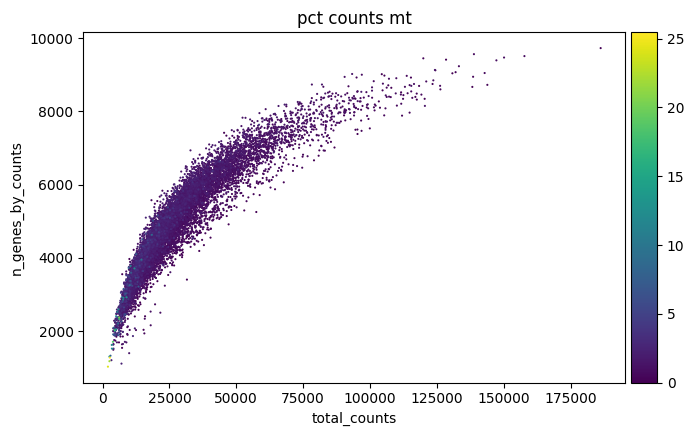

In [4]:
# Quality control

adata.var["mt"] = adata.var_names.str.startswith("mt-")
scanpy.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], inplace=True, percent_top=[], log1p=False
)

scanpy.pp.calculate_qc_metrics(
    adata, inplace=True, percent_top=[], log1p=False
)
histogram = seaborn.displot(adata.obs["total_counts"], bins=100, kde=False)
scatter = scanpy.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

View of AnnData object with n_obs × n_vars = 12852 × 78334
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


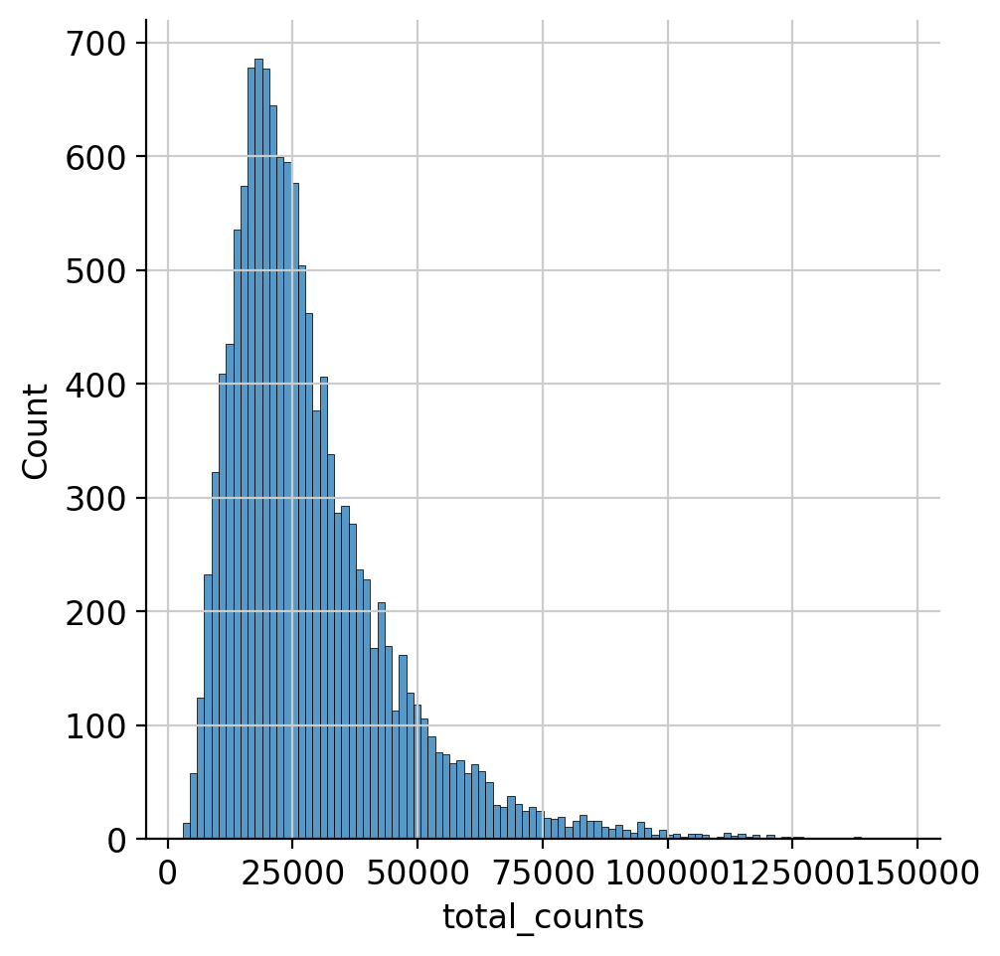

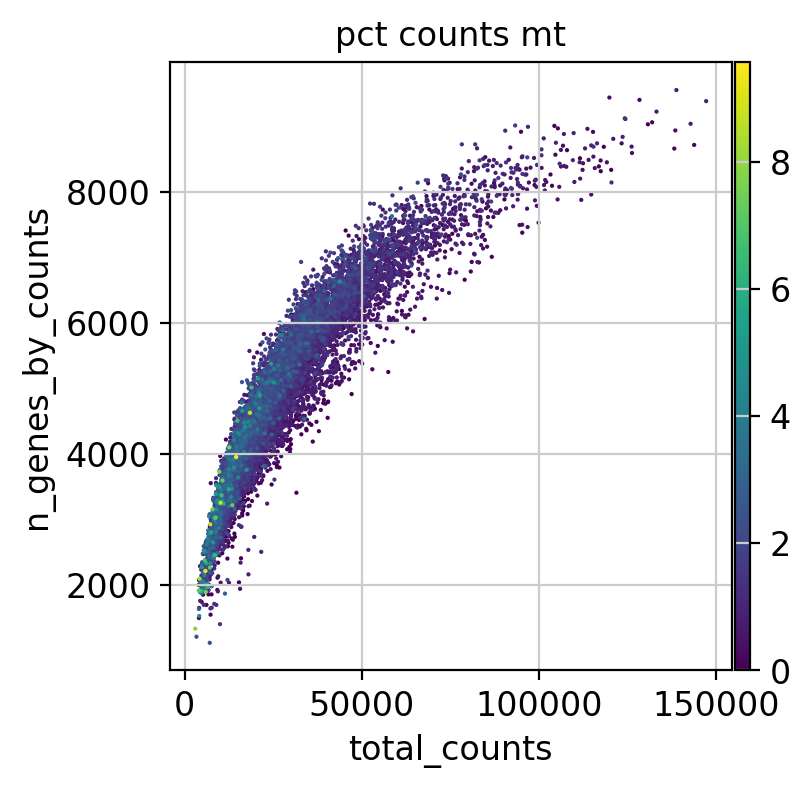

In [70]:
# Filter cells by counts per cell, total counts and percent mitochondrial
included_cells = (adata.obs["n_genes_by_counts"] >= 200)*(adata.obs['total_counts'] <= 150000)*(adata.obs['pct_counts_mt'] < 10)
adata = adata[included_cells]
print(adata)
histogram = seaborn.displot(adata.obs["total_counts"], bins=100, kde=False)
scatter = scanpy.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [6]:
# Filter and normalize

adata_velocity = adata.copy()

# Filter genes by spliced and unspliced counts and normalize
scvelo.pp.filter_and_normalize(adata_velocity, min_shared_counts=20, n_top_genes=2000)

print(f"Filtered Anndata object:\n{adata_velocity}")

Filtered out 64811 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered Anndata object:
AnnData object with n_obs × n_vars = 12852 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'sample_colors', 'log1p'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


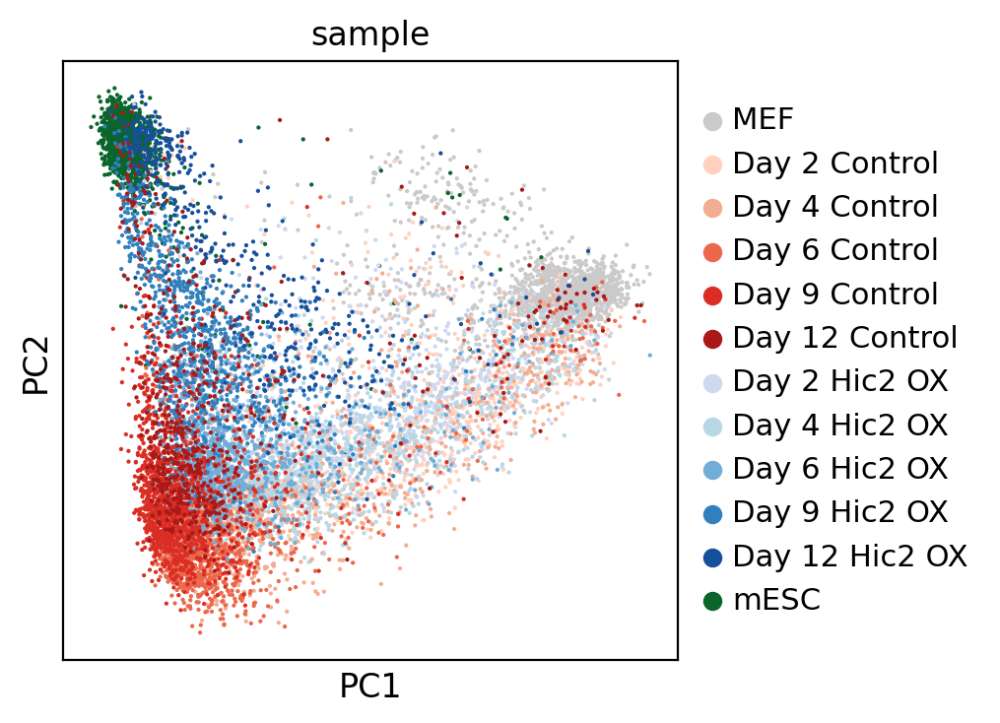

In [71]:
# Principal component analysis

scanpy.pp.pca(adata_velocity, n_comps=50)
scanpy.pl.pca(adata_velocity, color="sample")

In [8]:
# Find neighbors with PCA

scanpy.pp.neighbors(adata_velocity, n_neighbors=30, use_rep="X_pca")

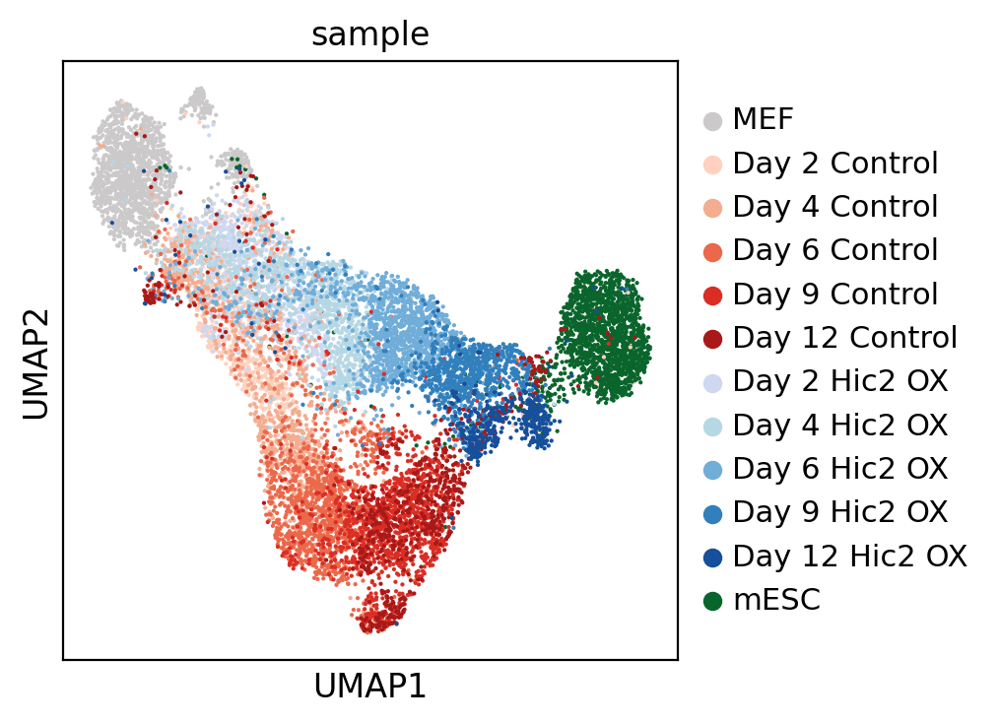

In [39]:
# Create UMAp

scanpy.tl.umap(adata_velocity)
scanpy.pl.umap(
    adata_velocity,
    color="sample",
)

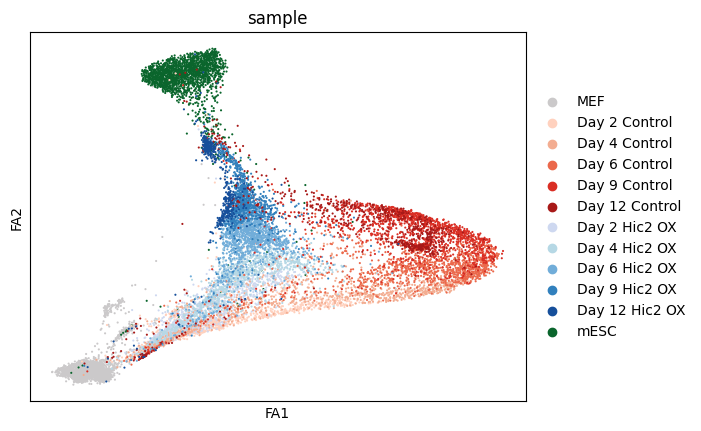

In [10]:
# Create FDL

scanpy.tl.draw_graph(adata_velocity, random_state=4131, n_jobs=32)
scanpy.pl.draw_graph(adata_velocity, color="sample")

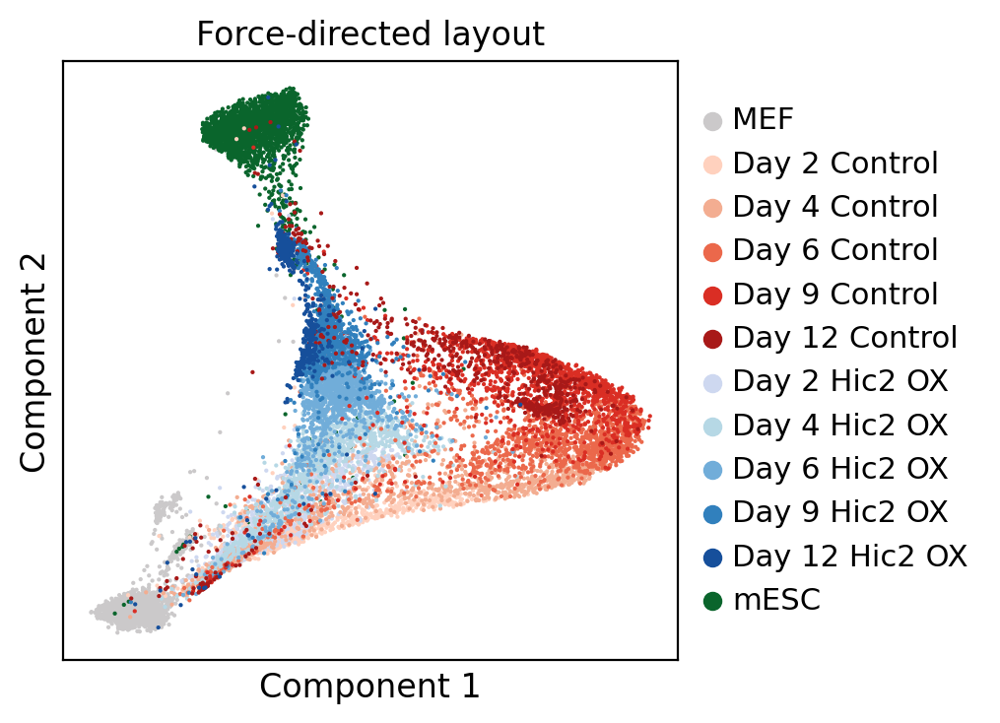

In [92]:
# Smaller FDL plot

axis = scanpy.pl.draw_graph(adata_velocity, color="sample", title="Force-directed layout", show=False)
axis.set_xlabel("Component 1")
axis.set_ylabel("Component 2")
pyplot.show()

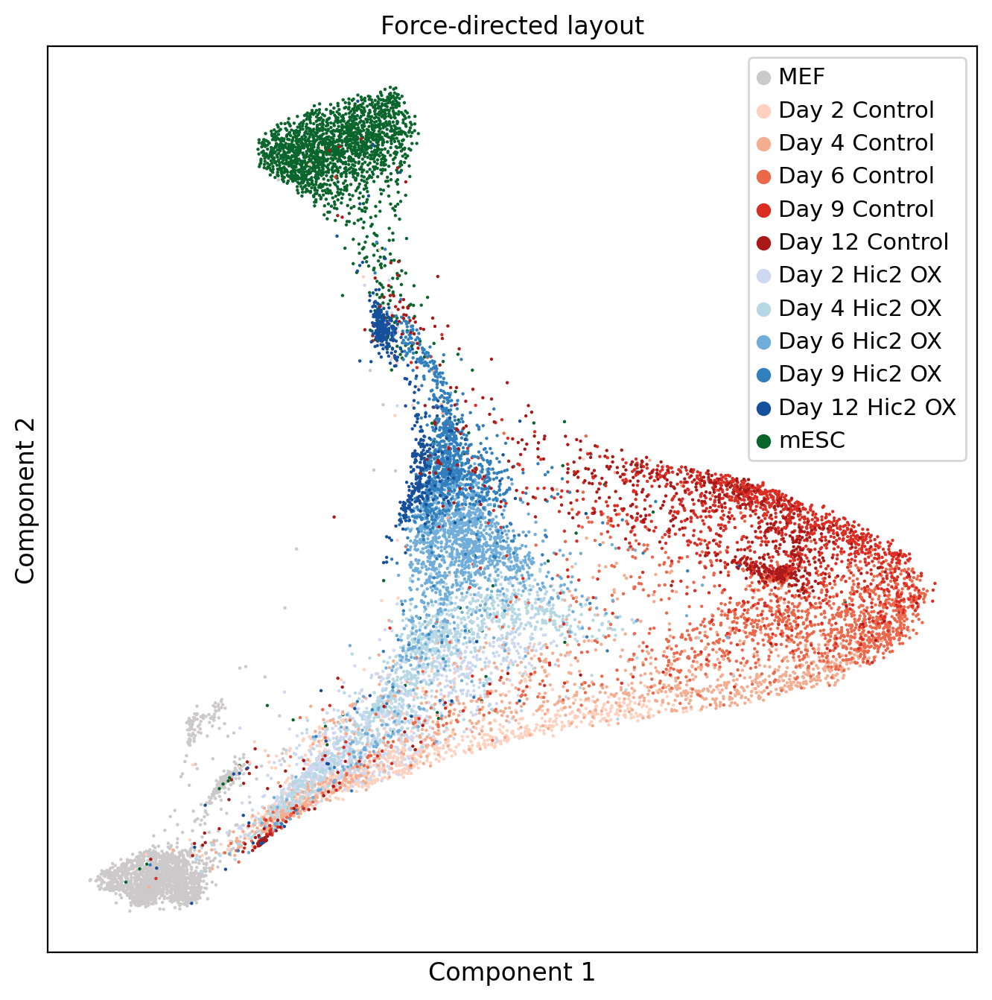

In [77]:
# Plot FDL

axis = scanpy.pl.embedding(basis='X_draw_graph_fa', adata=adata_velocity, color="sample", size=10, title="Force-directed layout", show=False, legend_loc="upper right")
axis.set_xlabel("Component 1")
axis.set_ylabel("Component 2")
figure = axis.get_figure()
figure.set_size_inches((8,8))
pyplot.show()

In [12]:
# Compute first and second moments

scvelo.pp.moments(adata_velocity, n_pcs=None, n_neighbors=30)

computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [13]:
# Calculate EM velocities

scvelo.tl.recover_dynamics(adata_velocity, n_jobs=32)

recovering dynamics (using 32/64 cores)


  0%|          | 0/1454 [00:00<?, ?gene/s]

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2303369) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:06:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [14]:
# Visualize EM velocities

scvelo.tl.velocity(adata_velocity, mode='dynamical')
scvelo.tl.velocity_graph(adata_velocity, n_jobs=32)

computing velocities
    finished (0:00:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 32/64 cores)


  0%|          | 0/12852 [00:00<?, ?cells/s]

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/multiprocessing/popen_fork.py:66: DeprecationWarning: This process (pid=2303369) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

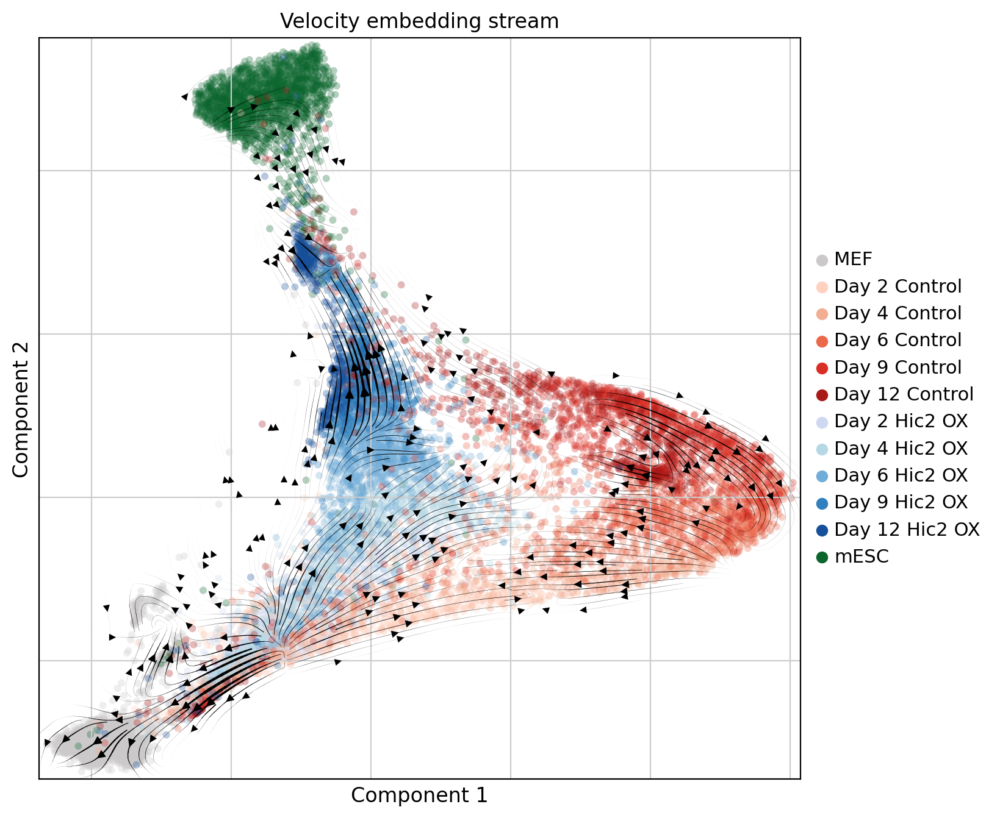

In [83]:
axis = scvelo.pl.velocity_embedding_stream(adata_velocity, basis="X_draw_graph_fa", color="sample", legend_loc="right", figsize=(8,8), title="Velocity embedding stream", density=5, linewidth=1, show=False)
axis.set_xlabel("Component 1")
axis.set_ylabel("Component 2")
pyplot.show()

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

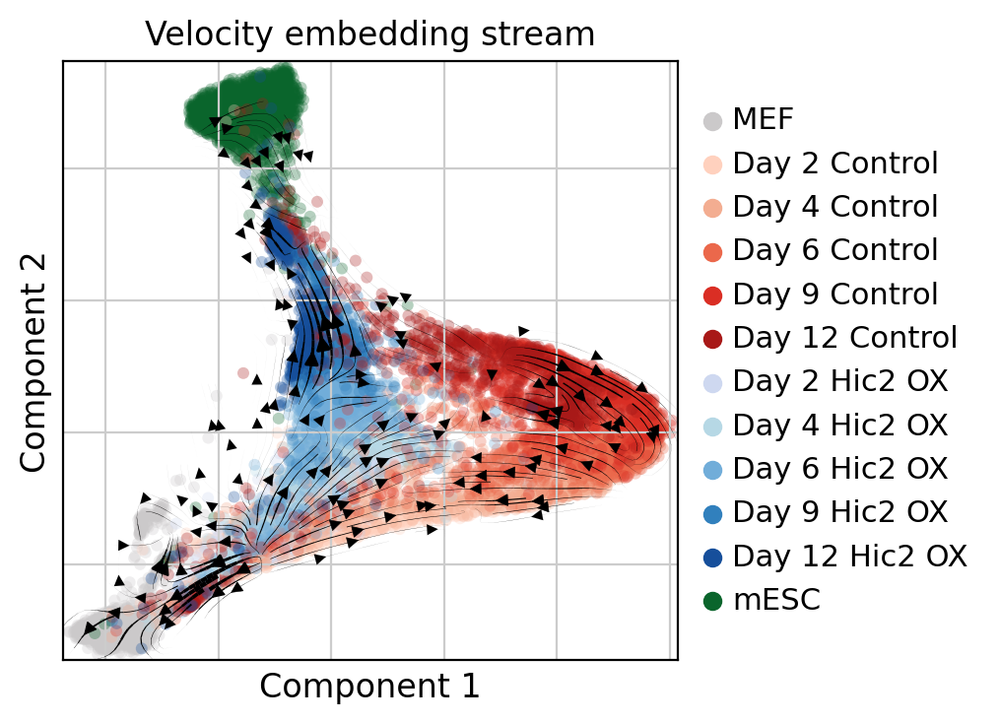

In [95]:
# Smaller embedding stream
axis = scvelo.pl.velocity_embedding_stream(adata_velocity, basis="X_draw_graph_fa", color="sample", legend_loc="right", title="Velocity embedding stream", density=3, linewidth=1, show=False)
axis.set_xlabel("Component 1")
axis.set_ylabel("Component 2")
pyplot.show()

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

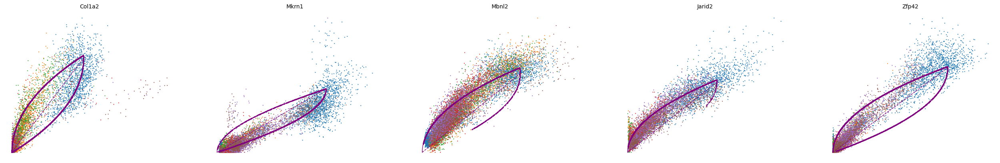

In [16]:
# Plot top genes
top_genes = adata_velocity.var["fit_likelihood"].sort_values(ascending=False).index
scvelo.pl.scatter(adata_velocity, basis=top_genes[:5], color=["day"], frameon=False)

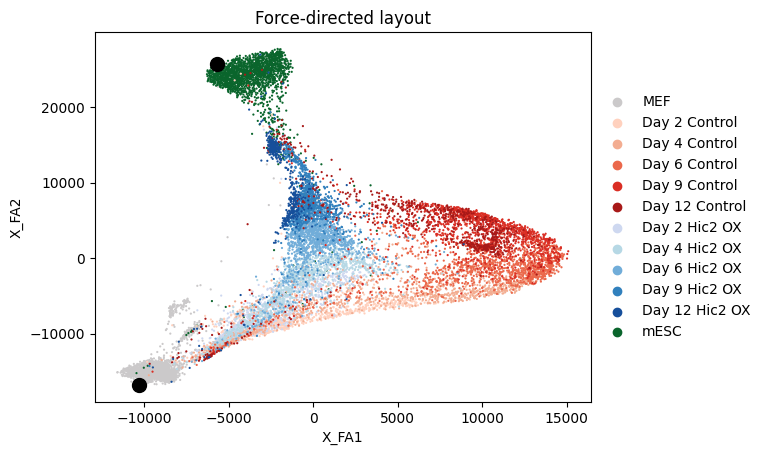

In [17]:
# Find good root and end cells

# Find root
root_filter = (adata_velocity.obs["group"]=="MEF")
# Use MEF cell in bottom left
root_index = numpy.argmin(adata_velocity[root_filter].obsm["X_draw_graph_fa"][:,0]+adata_velocity[root_filter].obsm["X_draw_graph_fa"][:,1])
root_barcode = adata_velocity[root_filter].obs.index[root_index]
adata_velocity.obs["manual_root"] = False
adata_velocity.obs["manual_root"].loc[root_barcode] = True

# Find end
end_filter = adata_velocity.obs["group"]=="mESC"
# Use mESC cell in top left
end_index = numpy.argmin(adata_velocity[end_filter].obsm["X_draw_graph_fa"][:,0]-adata_velocity[end_filter].obsm["X_draw_graph_fa"][:,1])
end_barcode = adata_velocity[end_filter].obs.index[end_index]
adata_velocity.obs["manual_end"] = False
adata_velocity.obs["manual_end"].loc[end_barcode] = True

ax = scanpy.pl.embedding(basis='X_draw_graph_fa', adata=adata_velocity, color="sample", size=10, title="Force-directed layout", show=False)

# Plot UMAP
ax.scatter(*adata_velocity[adata_velocity.obs["manual_end"]].obsm["X_draw_graph_fa"][0], marker="o", s=100, color="black")
ax.scatter(*adata_velocity[adata_velocity.obs["manual_root"]].obsm["X_draw_graph_fa"][0], marker="o", s=100, color="black")
ax.yaxis.set_major_locator(matplotlib.ticker.AutoLocator())
ax.xaxis.set_major_locator(matplotlib.ticker.AutoLocator())

pyplot.show()

computing latent time using manual_root, manual_end as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


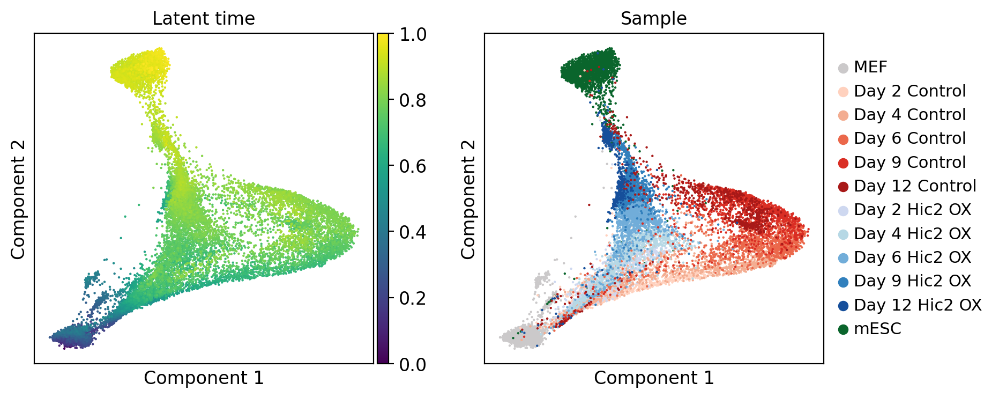

In [86]:
# Latent time

# Calculate latent time
scvelo.tl.recover_latent_time(adata_velocity, root_key="manual_root", end_key="manual_end")

# Plot velocities colored by latent time
axis_list = scanpy.pl.embedding(basis='X_draw_graph_fa', adata=adata_velocity, color=["latent_time", "sample"], size=10, title=["Latent time", "Sample"], show=False)
for axis in axis_list:
    axis.set_xlabel("Component 1")
    axis.set_ylabel("Component 2")
pyplot.show()


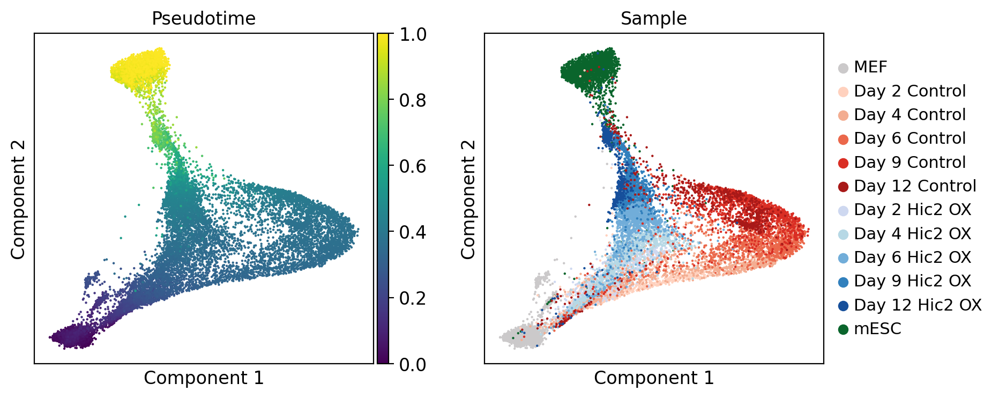

In [87]:
# Pseudotime
global_root_index = numpy.argmax(adata_velocity.obs.index == root_barcode)
global_end_index = numpy.argmax(adata_velocity.obs.index == end_barcode)

scvelo.tl.velocity_pseudotime(adata_velocity, root_key=global_root_index, end_key=global_end_index)

# Plot velocities colored by latent time
axis_list = scanpy.pl.embedding(basis="X_draw_graph_fa", adata=adata_velocity, color=["velocity_pseudotime", "sample"], size=10, title=["Pseudotime", "Sample"], show=False)
for axis in axis_list:
    axis.set_xlabel("Component 1")
    axis.set_ylabel("Component 2")
pyplot.show()

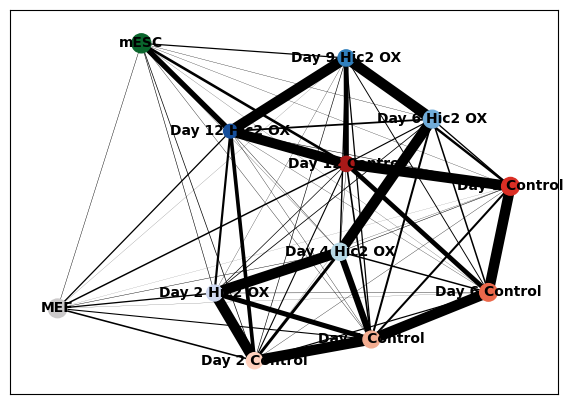

In [20]:
scanpy.tl.paga(adata_velocity, groups='sample')
scanpy.pl.paga(adata_velocity, color='sample')

running PAGA using priors: ['velocity_pseudotime', 'manual_root', 'manual_end']
    finished (0:00:02) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

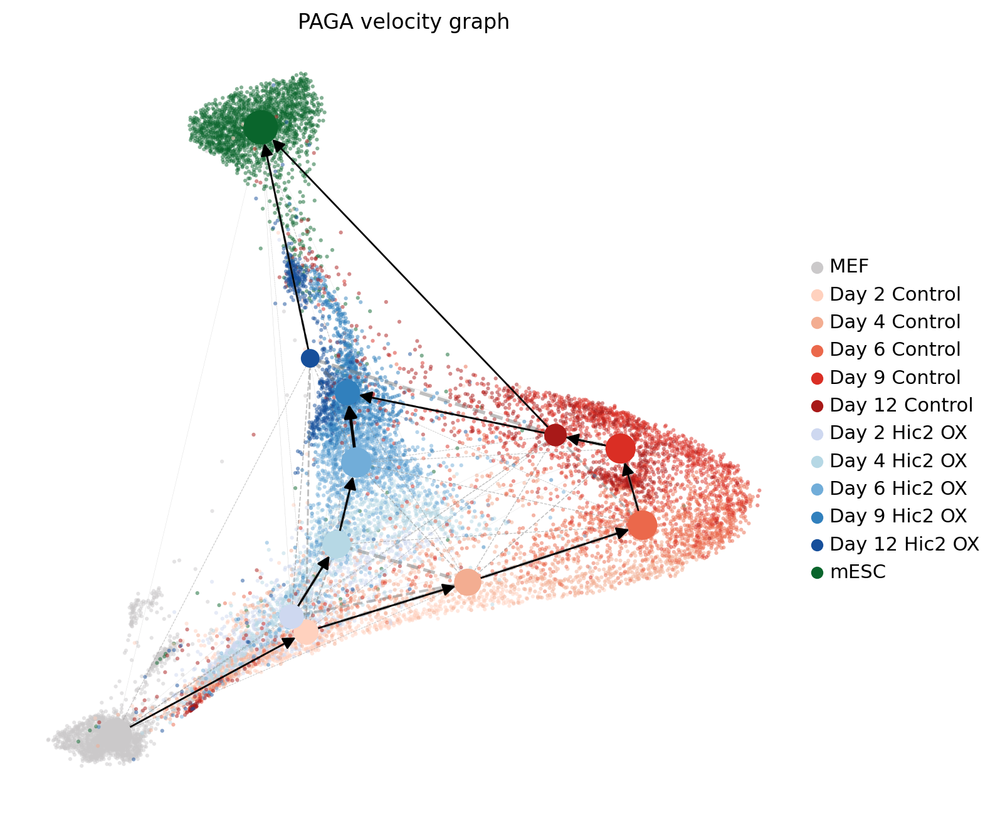

In [88]:
adata_velocity.obs["manual_root"] = adata_velocity.obs["manual_root"].astype(float)
adata_velocity.obs["manual_end"] = adata_velocity.obs["manual_end"].astype(float)
scvelo.tl.paga(adata_velocity, groups="sample", root_key="manual_root", end_key="manual_end", minimum_spanning_tree=True, use_time_prior="velocity_pseudotime")
scvelo.pl.paga(adata_velocity, basis="draw_graph_fa", figsize=(8,8), node_size_power=1, min_edge_width=1, node_size_scale=1.5, title="PAGA velocity graph", size=20)

In [23]:
# Save adata
adata_velocity.write_h5ad(
    "/scratch/lema/m26_losu/velocity_star_new_fdl.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

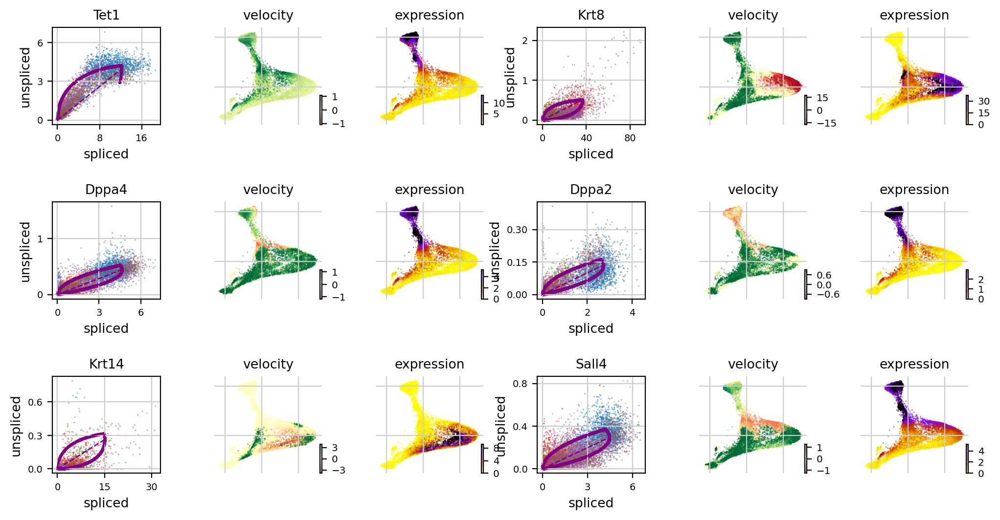

In [119]:
# Plot velocity dynamics for specific genes
important_genes = ["Tet1", "Krt8", "Dppa4", "Dppa2", "Krt14", "Sall4"]
scvelo.pl.velocity(adata_velocity, var_names=important_genes, basis="draw_graph_fa", color="day", ncols=2)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/avesta/m26_losu/

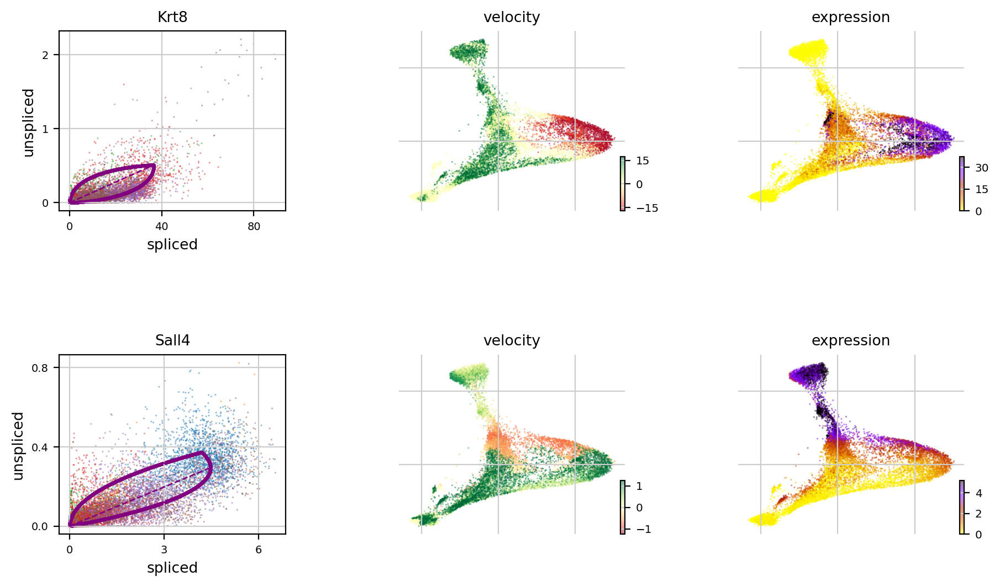

In [120]:
# Plot velocity dynamics for specific genes
important_genes = ["Tet1", "Krt8", "Zfp42", "Dppa4", "Dppa2"]
scvelo.pl.velocity(adata_velocity, var_names=["Krt8", "Sall4"], basis="draw_graph_fa", color="day", figsize=(7,6))

In [127]:
import warnings
# Ignore DeprecationWarnings for scvelo/dependencies
warnings.filterwarnings('ignore', category=DeprecationWarning)

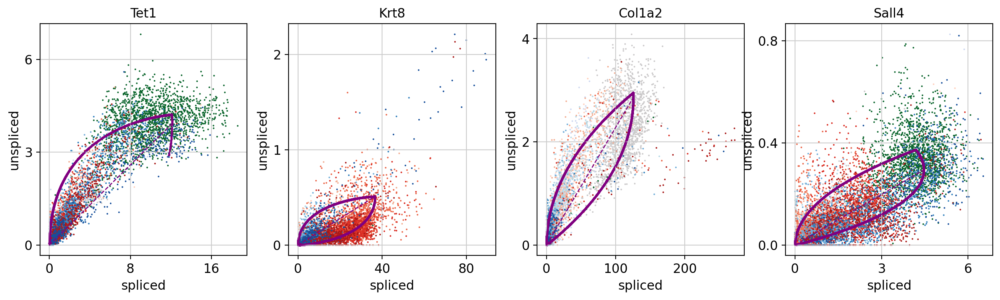

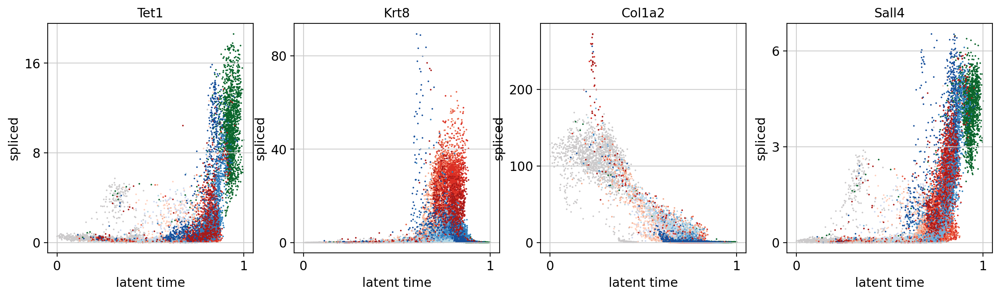

In [149]:
important_genes = ["Tet1", "Krt8", "Col1a2", "Sall4"]
scvelo.pl.scatter(adata_velocity, important_genes, color="sample")
scvelo.pl.scatter(adata_velocity, x='latent_time', y=important_genes, color="sample")

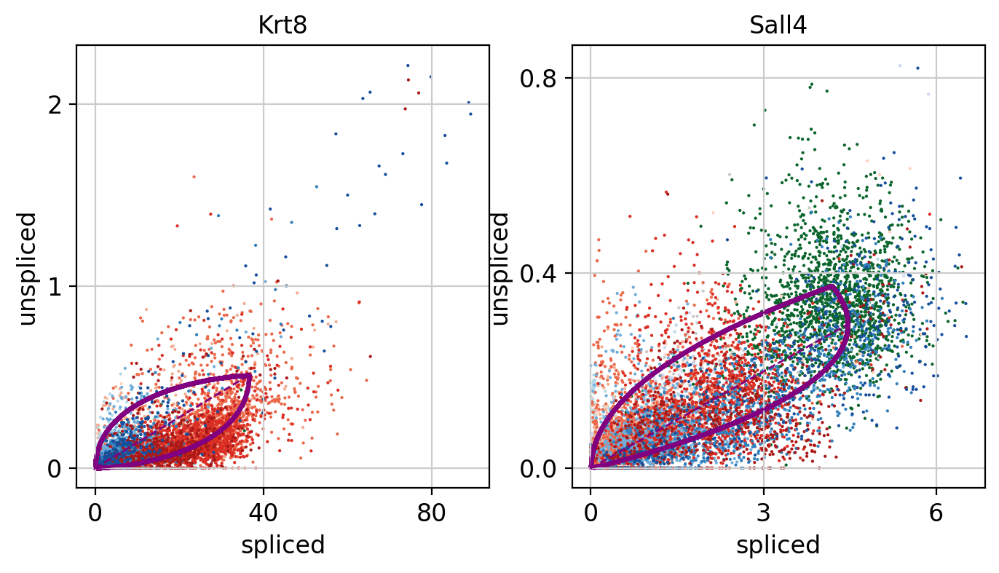

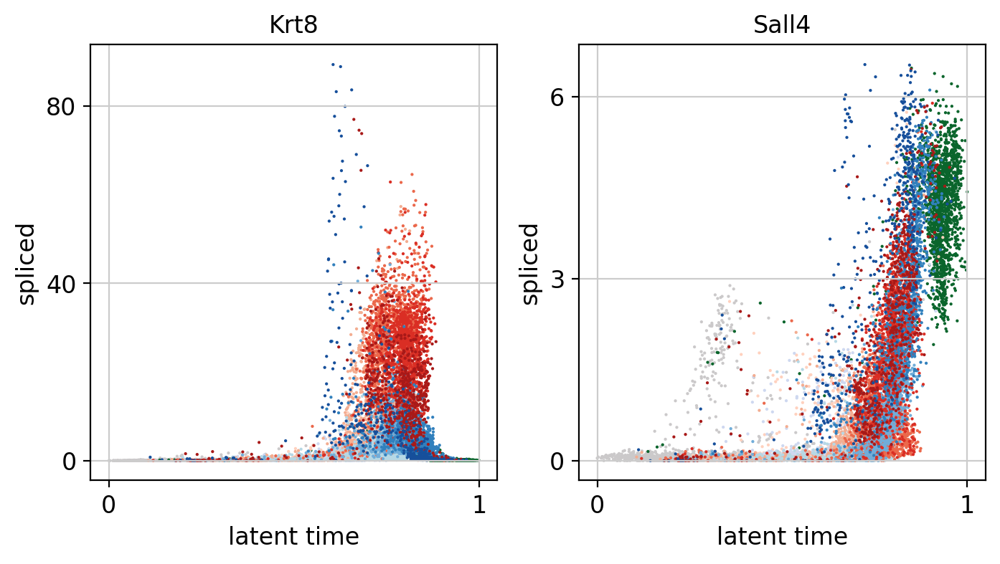

In [151]:
representative_genes = ["Krt8", "Sall4"]
scvelo.pl.scatter(adata_velocity, representative_genes, color="sample")
scvelo.pl.scatter(adata_velocity, x='latent_time', y=representative_genes, color="sample")

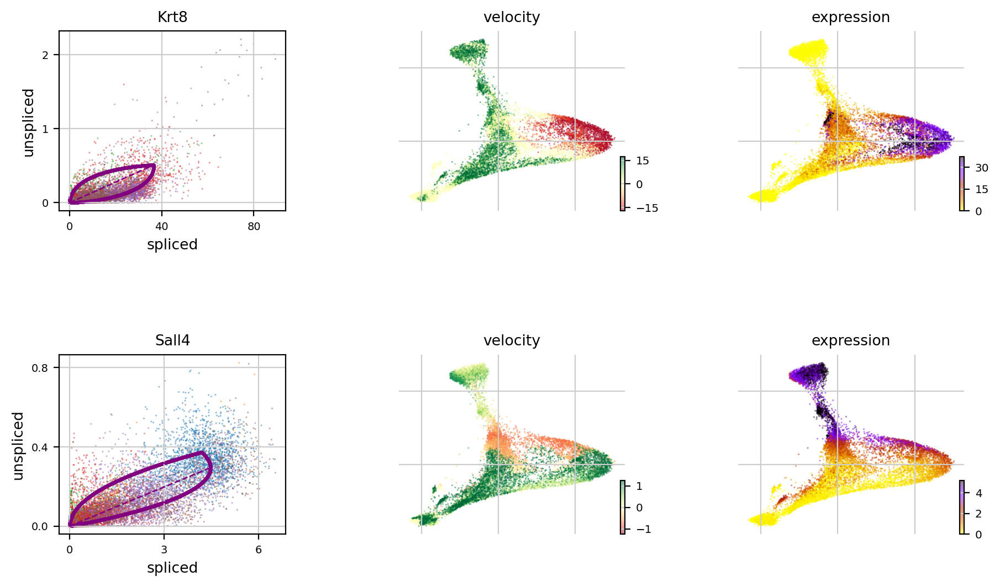

In [157]:
scvelo.pl.velocity(adata_velocity, var_names=representative_genes, basis="draw_graph_fa", color="day", figsize=(7,6), fits="fit_gamma")

In [148]:
scvelo.get_df(adata_velocity[:, important_genes], 'fit*', dropna=True)

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
gene_names,,,,,,,,,,,,,,,,
Tet1,0.855044,2.496253,0.589193,0.190792,18.682225,0.482155,1.308487,3.435261,0.405972,0.0,0.0,0.498442,3.932975,7.841418,0.314884,4.243690
Krt8,0.544469,41.464434,81.389473,1.134241,12.089151,0.018017,0.136421,11.528125,0.247247,0.0,0.0,0.499445,0.464296,29.062419,0.637860,0.934442
Dppa4,0.813155,4.503264,7.074906,0.676327,4.938461,0.050310,0.184942,1.736920,0.494164,0.0,0.0,0.489811,0.420884,4.195944,0.199915,1.264252
Col1a2,0.797814,148.645062,48.933333,1.115144,5.915299,0.012306,0.929465,43.618179,0.637585,0.0,0.0,0.499484,1.883687,114.433723,0.120671,0.913357
Sall4,0.667541,4.649348,9.624765,0.635078,4.128209,0.037326,0.126104,1.596295,0.412044,0.0,0.0,0.489064,0.305893,4.333750,0.322271,1.252581


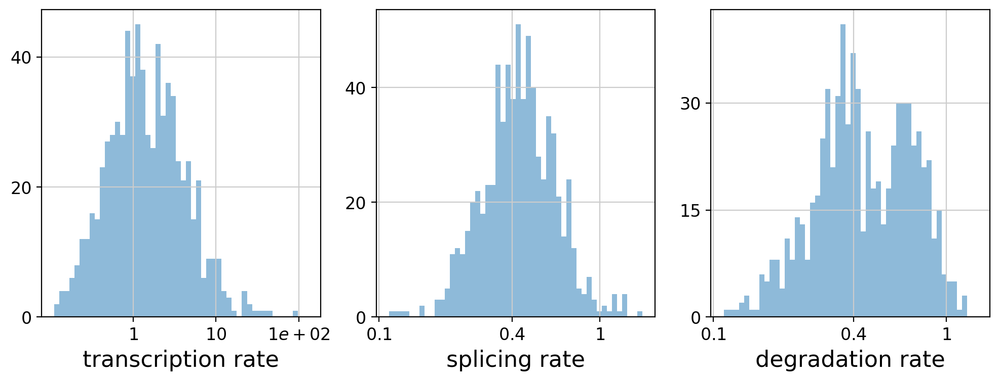

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
gene_names,,,,,,,,,,,,,,,,
Rb1cc1,0.573134,2.458354,2.046154,0.429407,13.103742,0.104168,0.276870,1.255865,2.403947e-01,0.0,0.0,0.491042,1.019257,4.421179,0.937425,2.216811
Alkal1,0.762725,1.085185,2.100849,1.015015,6.764179,0.239330,0.110229,0.217621,5.090115e-15,0.0,0.0,0.488577,0.484193,0.785887,1.650750,0.894996
Gm69572,0.782338,1.197602,0.919606,0.805873,6.421963,0.500064,0.429535,0.399416,2.981934e-01,0.0,0.0,0.451987,1.157851,1.072940,0.596757,0.976108
Gm71166,0.179651,0.210848,3.621572,0.309419,4.487127,0.193083,0.020076,0.140365,1.315729e-01,0.0,0.0,0.338535,0.062123,0.386952,1.172195,1.930598
Sulf1,0.681560,0.682174,0.225538,0.176843,17.474360,1.110062,0.906064,0.966550,2.742443e-01,0.0,0.0,0.486998,2.454225,2.773332,0.704198,4.504604


In [146]:
df = adata_velocity.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scvelo.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scvelo.get_df(adata_velocity, 'fit*', dropna=True).head()
